<a href="https://colab.research.google.com/github/padap/temporary_files/blob/master/Problem.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

  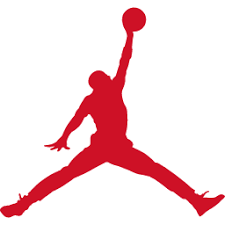
  <center> <h1> Задача. </h1></center>
  
---
        На основании приложенных данных необходимо построить модель, описать процесс отбора факторов, 
        дать комментарии о качестве модели и стабильности полученного результата. 
        Также интересен сам процесс загрузки данных и построения модели. 
        Предпочтительная среда разработки python. 
        Желательно не использовать библиотеки, установка которых предполагает приложение больших усилий 
        (например, библиотеки, которые надо компилировать на C, чтобы потом использовать). 

        Результатом решения задачи является небольшой отчет с комментариями о полученных результатах и скрипты, 
        использованные для получения результатов.

        Для первых двух задач нужно брать данные из файла problem_data.csv
        Примечание: столбец pos_id использовать только как категориальную переменную.
        
        
    1. 
        Модель на бинарной переменной (target_c). 
        Желательно применить как интерпретируемые методы, так и методы, дающие более качественные модели.

    2. 
        Модель на агрегированных данных (целевая переменная – target_2 из файла problem_data2.csv). 
        Задача –сгенерировать интересные агрегаты на основании файла problem_data.csv, сопоставить их с целевой 
        переменной из  problem_data2.csv, отобрать факторы при ограничении количества наблюдений, построить модель, 
        дать комментарии о качестве модели.

    3. 
        Как можно понять из файла problem_data2.csv, данные в файле об игроках и командах NBA. Добавлю, что данные 
        за 13/14 год. В качестве дополнительной задачи предлагается собрать данные с сайта basketball-reference.com, 
        которые могут улучшить модель из пункта 3, или же помогут проверить интересную гипотезу. Требуется описать 
        процесс сбора данных, добавление в модель, оценить, насколько добавленные данные улучшают модель. 
        (Важно, что данные из «будущего» брать нельзя).

# Задание 1

#### Импортируем и установим библиотеки

In [0]:
!pip install catboost
!pip install Counter

In [0]:
import pandas as pd
import numpy as np

from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from catboost import CatBoostClassifier


#Disable warnings
import warnings
warnings.filterwarnings("ignore")

#### Подключим google диск

In [0]:
# Load the Drive helper and mount
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


проверим что диск подключился

In [0]:
!ls drive/My\ Drive/sber_tz

basketball_refference_main_table.csv  problem_data.csv	Задача.docx
problem_data2.csv		      Problem.ipynb


#### Загрузим данные таблиц

In [0]:
df = pd.read_csv('drive/My Drive/sber_tz/problem_data.csv', sep = ';')
print('df.shape =', df.shape)
df.head()

df.shape = (419, 37)


,ID,Team_id,Target_r,Target_c,stat_0,bio_2,bio_3,bio_4,bio_5,pos_id,bio_6,stat_1,stat_2,stat_3,stat_4,stat_5,stat_6,stat_7,stat_8,stat_9,stat_10,stat_11,stat_12,stat_13,stat_14,stat_15,stat_16,team_stat_1,team_stat_2,team_stat_3,team_stat_4,team_stat_5,team_stat_6,team_stat_7,team_stat_8,stat_17,bio_7
0,1,6,1063384,0,9,74,181,1,1,2,27,28,0,3.5,0.413,0.273,0.542,0.000,0.0,0.3,0.4,0.5,0.0,0.0,0.3,0.2,1.6,24.9,710522,0.459,19,4,1,0,-18973768,2.519211,2
1,2,4,915243,0,37,72,161,1,1,1,29,72,12,21.6,0.401,0.387,0.411,0.874,0.6,1.3,1.9,3.2,0.7,0.2,1.6,2.0,9.0,25.5,636268,0.434,9,0,0,0,-12889458,4.206993,7
2,3,9,1227985,0,8,84,270,1,1,5,29,37,6,9.6,0.443,0.000,0.450,0.550,1.1,1.9,3.0,0.6,0.3,0.2,0.8,1.7,1.8,24.7,616005,0.487,40,11,5,3,-3673182,1.488424,7
3,4,12,816482,0,0,79,200,1,1,3,20,6,1,6.2,0.429,0.200,0.556,1.000,0.0,0.5,0.5,0.5,0.0,0.0,0.2,1.0,2.3,27.2,717542,0.511,31,9,1,3,-12109324,0.211784,1
4,5,1,12000000,0,64,82,245,0,1,5,27,29,29,33.0,0.567,0.364,0.572,0.682,2.3,6.1,8.4,2.6,0.9,1.5,2.2,1.9,18.6,27.5,587927,0.498,44,11,0,1,4727329,1.308728,8


In [0]:
df2 = pd.read_csv('drive/My Drive/sber_tz/problem_data2.csv', sep = ';')
print('df2.shape =', df2.shape)
df2.head()

df2.shape = (30, 3)


,Tm,Team_id,Target_2
0,ATL,1,0.2500
1,BOS,2,0.0625
2,BRK,3,0.0625
3,CHI,4,0.1250
4,CHO,5,0.0000


In [0]:
df2['Target_2'].value_counts()

0.0000    14
0.0625     8
0.1250     4
0.2500     2
1.0000     1
0.5000     1
Name: Target_2, dtype: int64

### Визуализируем данные

##### pairplot

/usr/local/lib/python3.6/dist-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/usr/local/lib/python3.6/dist-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


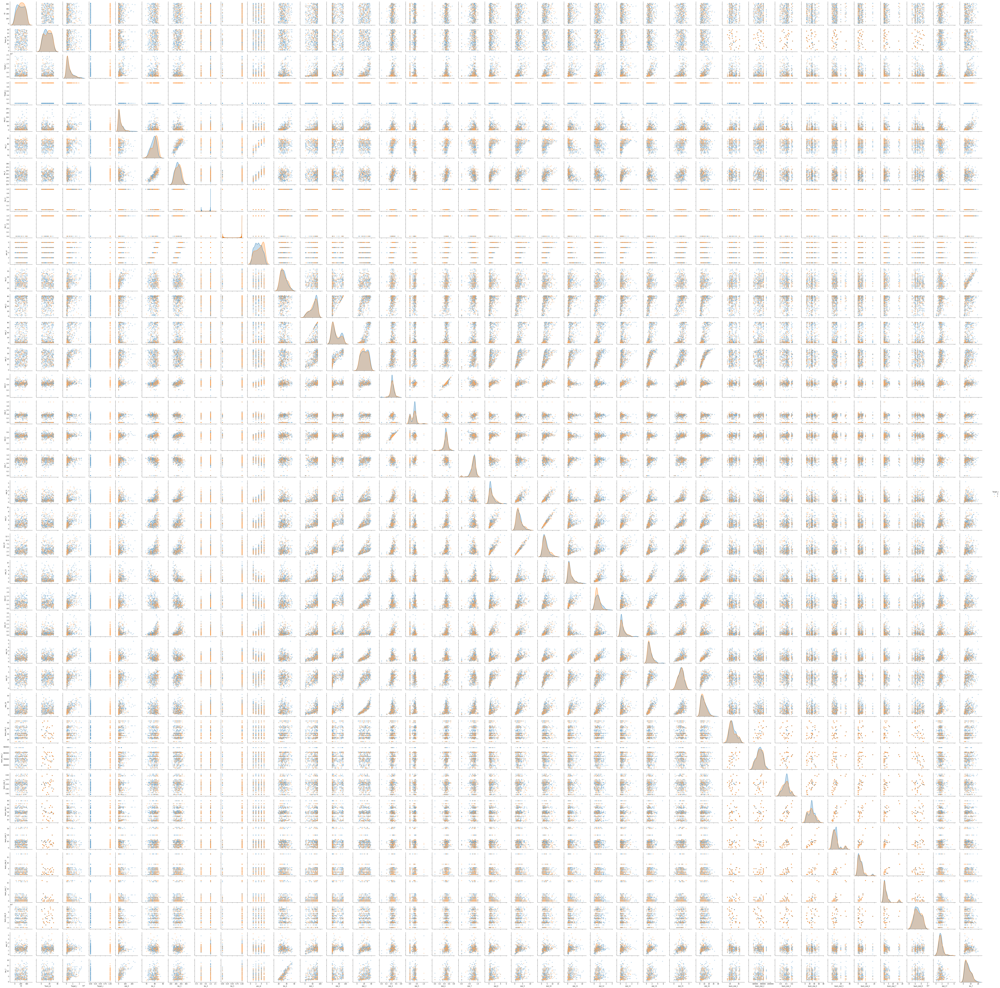

In [0]:
sns.pairplot(df, hue = 'Target_c', plot_kws = {'alpha' : 0.3})

##### pairplot для одной конкретной коммады

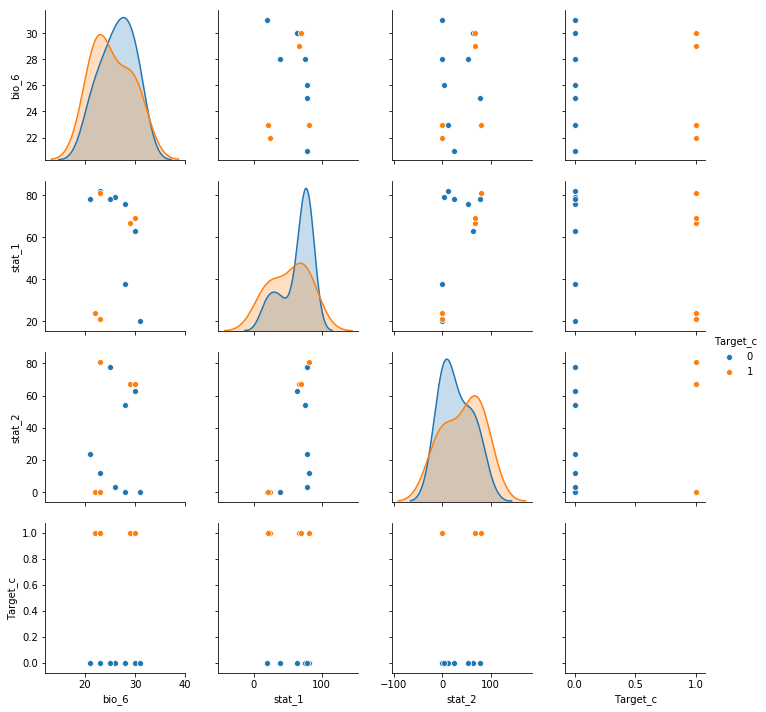

In [0]:
import seaborn as sns
sns.pairplot(df[df['Team_id'] == 10][['bio_6', 'stat_1', 'stat_2', 'Target_c']], hue = 'Target_c')

##### Кореляция признаков между собой

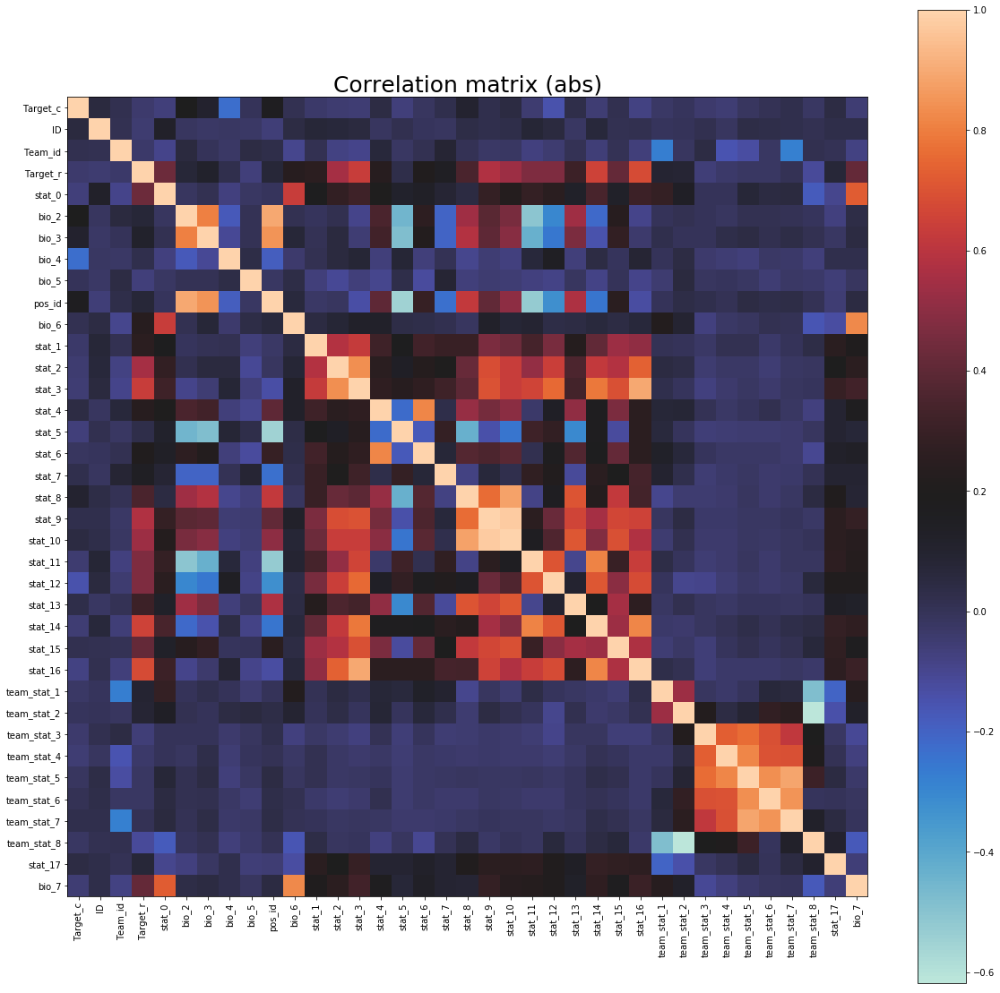

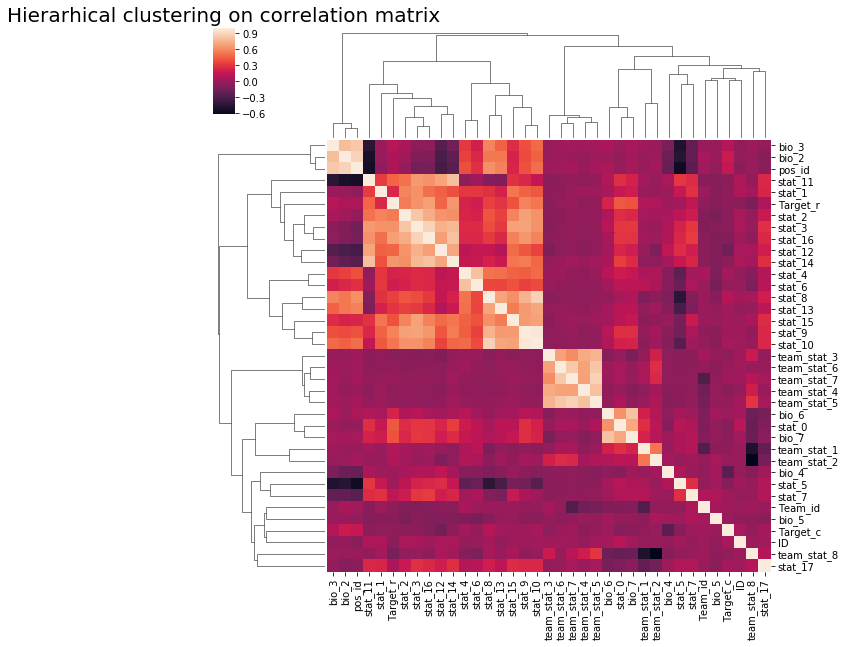

In [0]:
features = list(df.keys())
features.remove('Target_c')
features = ['Target_c'] + features
plt.figure(figsize = (20, 20))
plt.title('Correlation matrix (abs)', fontsize = 25)
plt.xticks(range(len(features)), features, rotation='vertical')
plt.yticks(range(len(features)), features)
plt.imshow(df[features].corr(), cmap = 'icefire')

plt.colorbar()
plt.show()

sns.clustermap(df[features].corr())
plt.title('Hierarhical clustering on correlation matrix', fontsize = 20)
plt.show()

#### Вывод
**Что можно сказать из графиков**
  - stat1 = stat2+x, x>=0
  - Некоторые признаки сильно коррелируют например (bio_3 и bio_2)
  - ID линейно не связан с переменными
  
  Потратив более 2-х часов я так и не нашел data leak, и не понял что значит переменная target_c, но понял следующее


In [0]:
(df2['Target_2']*16) .value_counts()

0.0     14
1.0      8
2.0      4
4.0      2
16.0     1
8.0      1
Name: Target_2, dtype: int64

#### Метод пристального взгляда (что можно сказать посмотрев на данные и на сайт basketball-reference.com) 
 - Это данные по игрокам
 - Team_id - id комманды
    (2 - Boston)
 - pos_id - позиция на поле
 - bio_6 - возраст
 - bio_7 - сколько лет игрок провел в NBA
 - stat1 - кол-во игр
 - stat2 - кол-во игр в которых игрок начинал в стартовом составе
 - stat3 - среднее кол-во минут на игру
 - stat4 - процент точных попаданий с игры
 - stat5 - процент попадания трехочковых
 - stat6 - кол-во двухочковых бросков
 - stat7 - кол-во штрафных бросков
 
 - target_r - **????** деньги игрока за сезон
 - target_с - **????**


 - Во втором файле Target_2:
       0    - не вышли в плей-офф
       1/16 - выход в  плей-офф
       1/8  - 1/4 финала
       1/4  - 1/2 финала
       1/2  - финалист
       1    - победитель



#### Посмотрим нужна ли на этой выборке кросс-валидация

Сравним две логистические регрессии с L1 и L2 регуляризацией

(Скорее всего модель с L1 регуляризацией должна работать лучше так как признаков много и выборка маленькая)

In [0]:
"""
   Это код для проверки гипотезы, поэтому он не очень красивый
    (он запускается только один раз тут)
"""

from tqdm import tqdm_notebook, tqdm
from sklearn.model_selection import train_test_split
from copy import deepcopy
from sklearn.metrics import cohen_kappa_score, f1_score
import warnings
warnings.filterwarnings("ignore")

num_exp = 100
model_l1 = LogisticRegression(penalty = 'l1', tol = 1e-9, C = 1)
model_l2 = LogisticRegression(penalty = 'l2', tol = 1e-9, C = 1)

res_list_l1 = {'cohen_kappa_score':{
              'test':[],
              'train':[]
            },
            'f1_score':{
              'test':[],
              'train':[]
            }
           }

res_list_l2 = deepcopy(res_list_l1)

for rs in tqdm(range(num_exp)):
  X_train, X_test, y_train, y_test = train_test_split(df[features], df['Target_c'], test_size=0.33, random_state=rs)
  model_l1.fit(X_train, y_train)
  p_test  = model_l1.predict(X_test)
  p_train = model_l1.predict(X_train)
  
  res_list_l1['cohen_kappa_score']['test'].append(cohen_kappa_score(y_test, p_test))
  res_list_l1['cohen_kappa_score']['train'].append(cohen_kappa_score(y_train, p_train))
  
  res_list_l1['f1_score']['test'].append(f1_score(y_test, p_test))
  res_list_l1['f1_score']['train'].append(f1_score(y_train, p_train))
  
  model_l2.fit(X_train, y_train)
  p_test  = model_l2.predict(X_test)
  p_train = model_l2.predict(X_train)
  
  res_list_l2['cohen_kappa_score']['test'].append(cohen_kappa_score(y_test, p_test))
  res_list_l2['cohen_kappa_score']['train'].append(cohen_kappa_score(y_train, p_train))
  
  res_list_l2['f1_score']['test'].append(f1_score(y_test, p_test))
  res_list_l2['f1_score']['train'].append(f1_score(y_train, p_train))

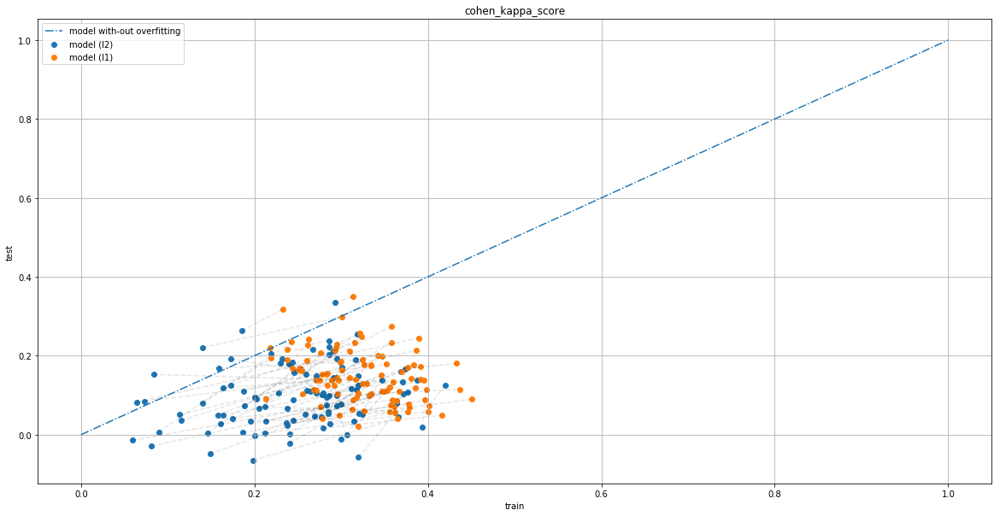

В 78.0% случаев L1 лучше L2 по метрике cohen_kappa_score


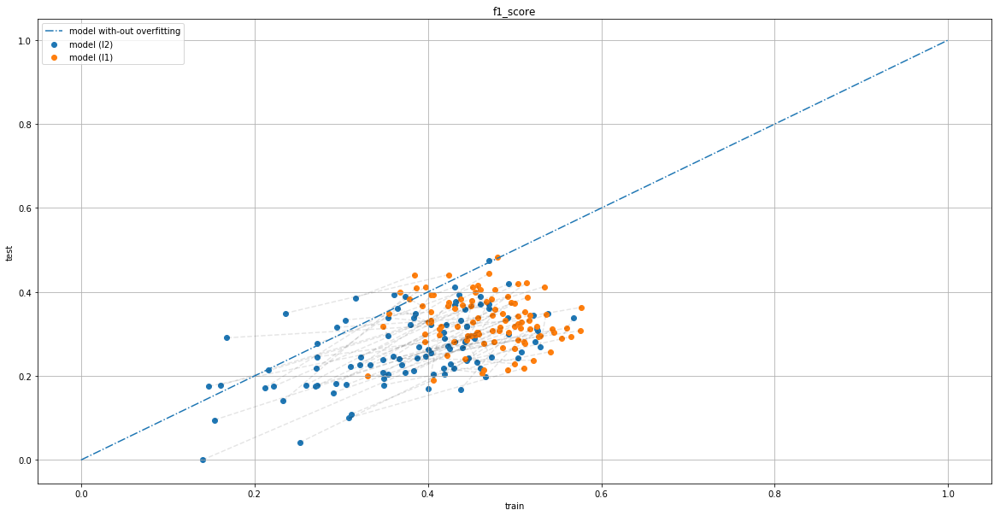

В 78.0% случаев L1 лучше L2 по метрике f1_score


In [0]:
for metric in ['cohen_kappa_score', 'f1_score']:
  plt.figure(figsize = (20, 10))
  plt.title(metric)
  plt.grid()
  plt.xlabel('train')
  plt.ylabel('test')
  plt.scatter(res_list_l2[metric]['train'], res_list_l2[metric]['test'], label = 'model (l2)')
  plt.scatter(res_list_l1[metric]['train'], res_list_l1[metric]['test'], label = 'model (l1)')
  
  # dots-line
  for i in range(num_exp):
    t =res_list_l2[metric]['train'][i]
    plt.plot([res_list_l2[metric]['train'][i], res_list_l1[metric]['train'][i]],
             [res_list_l2[metric]['test'][i], res_list_l1[metric]['test'][i]], '--',color = 'black', alpha = 0.1)
  plt.plot([0, 1], [0, 1], '-.', label = 'model with-out overfitting')
  plt.legend()
  plt.show()
  win_percent = 100*np.mean((np.array(res_list_l1[metric]['test'])-np.array(res_list_l2[metric]['test'])>0))
  print("В %2.1f%% случаев L1 лучше L2 по метрике %s"%(win_percent, metric))

#### На картинке сверху

Видно что без кросс-валидации сложно понять какая модель лучше 

В дальнейшем подсчет всех метрик будем производить на ней



### Попробуем несколько моделей

#### План
1. Попробуем несколько моделей
2. Отберем признаки
3. Подберем гиперпараметры

##### Logistic regression(L1)

In [0]:
model = LogisticRegression(penalty = 'l1', C = 20, tol = 1e-9)
_ = calculate_metrics(model, _print=True)

                             test     train
average_precision_score  0.428835  0.643116
cohen_kappa_score        0.198639  0.387395
f1_score                 0.388626  0.532067
roc_auc_score            0.639790  0.784769


In [0]:
feat_dct = {k:v for v, k in zip(model.coef_[0], all_features)}

for key, val in sorted(feat_dct.items(), key = lambda x:-abs(x[1])):
  if abs(val)<=1e-5:
    break
  print(' ', key,' '*(30-len(key)), "%2.4f"%val)
  

  stat_8                          5.8460
  stat_9                          5.2009
  stat_10                         -5.1427
  stat_4                          3.0896
  stat_12                         -2.1438
  stat_6                          -2.0134
  team_stat_3                     1.6367
  stat_5                          1.5343
  stat_13                         -0.9409
  bio_4                           -0.8098
  stat_15                         0.6907
  stat_7                          -0.6358
  stat_11                         0.3969
  bio_2                           0.2444
  team_stat_7                     0.2334
  stat_14                         0.2140
  stat_17                         -0.1394
  bio_5                           -0.1280
  bio_6                           0.1189
  bio_7                           -0.0718
  stat_16                         -0.0621
  team_stat_5                     -0.0603
  pos_id                          -0.0410
  team_stat_4                     -0.0400
  b

##### Logistic regression(L1) + StandartScaller

In [0]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
model = Pipeline([['StdSclr', StandardScaler()],
                  ['LR_L1',  LogisticRegression(penalty = 'l1')]])
_ = calculate_metrics(model, _print=True, model_name='LR(L1)+StdScl')

                             test     train
average_precision_score  0.449454  0.624043
cohen_kappa_score        0.208058  0.363691
f1_score                 0.388350  0.507317
roc_auc_score            0.653679  0.776645


##### Logistic regression(L1) + MinMaxScaller 

In [0]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
model = Pipeline([['MinMaxSclr', MinMaxScaler()],
                  ['LR_L1',  LogisticRegression(penalty = 'l1')]])
_ = calculate_metrics(model, _print=True, model_name='LR(L1)+MinMaxSclr')

                             test     train
average_precision_score  0.439494  0.541618
cohen_kappa_score        0.160993  0.200585
f1_score                 0.301676  0.340659
roc_auc_score            0.634807  0.713144


##### Logistic regression(L2)

In [0]:
model = LogisticRegression(penalty = 'l2')
_ = calculate_metrics(model, _print=True)

                             test     train
average_precision_score  0.325787  0.341684
cohen_kappa_score        0.000000  0.000000
f1_score                 0.000000  0.000000
roc_auc_score            0.504877  0.535080


##### Logistic regression(L2) + StandartScaller

In [0]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
model = Pipeline([['StdSclr', StandardScaler()],
                  ['LR_L2',  LogisticRegression(penalty = 'l2')]])
_ = calculate_metrics(model, _print=True, model_name='LR(L2)+StdSclr')

                             test     train
average_precision_score  0.437849  0.633119
cohen_kappa_score        0.182409  0.378790
f1_score                 0.373206  0.526066
roc_auc_score            0.647715  0.782516


##### Logistic regression(L1) + MinMaxScaller 

In [0]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
model = Pipeline([['MinMaxSclr', MinMaxScaler()],
                  ['LR_L2',  LogisticRegression(penalty = 'l2')]])
_ = calculate_metrics(model, _print=True, model_name='LR(L2)+StdSclr')

                             test     train
average_precision_score  0.446782  0.575918
cohen_kappa_score        0.187262  0.199252
f1_score                 0.329670  0.331461
roc_auc_score            0.642123  0.741578


##### Random Forest

In [0]:
model = RandomForestClassifier()
_ = calculate_metrics(model, _print=True, model_name='RF')

                             test     train
average_precision_score  0.405750  0.996886
cohen_kappa_score        0.125012  0.954825
f1_score                 0.282609  0.968504
roc_auc_score            0.613271  0.999049


##### Gradinet boosting

In [0]:
!pip install catboost

In [0]:
model = CatBoostClassifier()
_ = calculate_metrics(model, _print=True, model_name='GB')

Learning rate set to 0.011674
0:	learn: 0.6880909	total: 97ms	remaining: 1m 36s
1:	learn: 0.6842185	total: 133ms	remaining: 1m 6s
2:	learn: 0.6810429	total: 169ms	remaining: 56.3s
3:	learn: 0.6774565	total: 211ms	remaining: 52.5s
4:	learn: 0.6735575	total: 247ms	remaining: 49.1s
5:	learn: 0.6699961	total: 283ms	remaining: 46.9s
6:	learn: 0.6665543	total: 319ms	remaining: 45.2s
7:	learn: 0.6631953	total: 356ms	remaining: 44.2s
8:	learn: 0.6596779	total: 392ms	remaining: 43.2s
9:	learn: 0.6559824	total: 429ms	remaining: 42.5s
10:	learn: 0.6533669	total: 465ms	remaining: 41.8s
11:	learn: 0.6505878	total: 508ms	remaining: 41.8s
12:	learn: 0.6471750	total: 545ms	remaining: 41.4s
13:	learn: 0.6435858	total: 588ms	remaining: 41.4s
14:	learn: 0.6396054	total: 624ms	remaining: 41s
15:	learn: 0.6367329	total: 663ms	remaining: 40.8s
16:	learn: 0.6336711	total: 700ms	remaining: 40.5s
17:	learn: 0.6309822	total: 737ms	remaining: 40.2s
18:	learn: 0.6287301	total: 773ms	remaining: 39.9s
19:	learn: 0.

#### Simple desicion tree

In [0]:
model = DecisionTreeClassifier(max_depth=1, criterion='gini')
_ = calculate_metrics(model, _print=True, model_name='DT(depth = 1, gini)')

                             test     train
average_precision_score  0.395743  0.441749
cohen_kappa_score        0.107043  0.156728
f1_score                 0.174497  0.246835
roc_auc_score            0.590079  0.619596


In [0]:
model = DecisionTreeClassifier(max_depth=2, criterion='gini')
_ = calculate_metrics(model, _print=True, model_name='DT(depth = 2, gini)')

                             test     train
average_precision_score  0.432914  0.534412
cohen_kappa_score        0.186800  0.321301
f1_score                 0.406926  0.480952
roc_auc_score            0.616492  0.697748


In [0]:
model = DecisionTreeClassifier(max_depth=1, criterion='entropy')
_ = calculate_metrics(model, _print=True, model_name='DT(depth = 1, entropy')

                             test     train
average_precision_score  0.371930  0.425252
cohen_kappa_score        0.042650  0.087370
f1_score                 0.085106  0.138889
roc_auc_score            0.582392  0.631958


In [0]:
model = DecisionTreeClassifier(max_depth=2, criterion='entropy')
_ = calculate_metrics(model, _print=True, model_name='DT(depth = 2, entropy')

                             test     train
average_precision_score  0.358363  0.506832
cohen_kappa_score        0.119368  0.293465
f1_score                 0.368201  0.462264
roc_auc_score            0.568172  0.688070


In [0]:
model = DecisionTreeClassifier(max_depth=2, criterion='gini',
                               splitter='random')
_ = calculate_metrics(model, _print=True, model_name='DT(depth = 2, gini, splitter = random')

                             test     train
average_precision_score  0.374571  0.487028
cohen_kappa_score        0.087920  0.241271
f1_score                 0.336207  0.415459
roc_auc_score            0.596997  0.675152


#### Идея
Обычное дерево из sklearn работает жадно и сложно поймать зависимость от двух переменных

Напишем дерево, которое перебирает все возможные варианты для одного категориального  признака, с помощью этого измерим feature importance и попробуем получить хорошую модель (в качестве базового эстиматора, возьмем простую модель - LR и DT)

In [0]:
# !pip install Counter

In [0]:
from collections import Counter

class FeatureSplitModel():
  trees = {}
  features = None
  
  def __init__(self, max_depth = 1, feature_split='Team_id', est = None):
    self.max_depth = max_depth
    self.feature_split = feature_split
    self.est = DecisionTreeClassifier(
        max_depth = self.max_depth) if est is None else est
  
  def fit(self, X, y):
    features = list(X.keys())
    features.remove(self.feature_split)
    self.features = features
    X['_y'] = y
    self.max_class = max(Counter(y).items(), key = lambda x:x[1])[0]
    for theta, obj in X.groupby(self.feature_split):
      self.trees[theta] = self.est 
      self.trees[theta].fit(obj[features], obj['_y'])
    del X['_y']

  def predict(self, X):
    y_predict = {}
    
    for theta, obj in X.groupby(self.feature_split):
      if theta in self.trees:
        temp = self.trees[theta].predict(obj[self.features])
      else:
        temp = [self.max_class for i in range(len(obj))]
      for ind, val in zip(obj.index, temp):
        y_predict[ind] = val

    return [y_predict[ind] for ind in X.index]
  
  def predict_proba(self, X):
    y = self.predict(X)
    p = np.zeros((len(y), 2))
    p[list(range(len(y))), y] = 1
    return p
 

In [0]:
class SafeOneClassMixin:
    _single_class = None
    def fit(self, X, y, **kw):
        if len(np.unique(y)) == 1:
            self._single_class = True
            self.classes_ = np.unique(y)
            return self
        return super().fit(X, y, **kw)

    def predict(self, X):
        if self._single_class:
            return np.full(len(X), self.classes_[0])
        return super().predict(X)


class MyLR(SafeOneClassMixin, LogisticRegression):
    pass

In [0]:
print('LRL1 split pos_id')
model = FeatureSplitModel(est = MyLR('l1', C = 1), feature_split='pos_id')
calculate_metrics(model, _print=True, model_name='LRL1 split pos_id')

print('LRL1 split Team_id')
model = FeatureSplitModel(est = MyLR('l1', C = 1), feature_split='Team_id')
calculate_metrics(model, _print=True, model_name='LRL1 split Team_id')

print('LRL2 split pos_id')
model = FeatureSplitModel(est = MyLR('l2', C = 1), feature_split='pos_id')
calculate_metrics(model, _print=True, model_name='LRL2 split pos_id')

print('LRL2 split Team_id')
model = FeatureSplitModel(est = MyLR('l2', C = 1), feature_split='Team_id')
_ = calculate_metrics(model, _print=True, model_name='LRL2 split Team_id')

LRL1 split pos_id
                             test     train
average_precision_score  0.309590  0.342186
cohen_kappa_score       -0.010288  0.088663
f1_score                 0.439560  0.493363
roc_auc_score            0.492791  0.561857
LRL1 split Team_id
                             test     train
average_precision_score  0.312649  0.312649
cohen_kappa_score        0.000000  0.000000
f1_score                 0.000000  0.000000
roc_auc_score            0.500000  0.500000
LRL2 split pos_id
                             test     train
average_precision_score  0.313289  0.319842
cohen_kappa_score        0.002186  0.023930
f1_score                 0.437788  0.449827
roc_auc_score            0.501484  0.516235
LRL2 split Team_id
                             test     train
average_precision_score  0.312649  0.312649
cohen_kappa_score        0.000000  0.000000
f1_score                 0.000000  0.000000
roc_auc_score            0.500000  0.500000


In [0]:
feature_importance = {}
for feature_split in tqdm(all_features):
  if feature_split == 'ID':
    continue
  model = FeatureSplitModel(max_depth=1, feature_split = feature_split)
  X = df[all_features]
  y = df['Target_c']
  res = calculate_metrics(model, model_name='_2_split_%s'%feature_split)
  feature_importance[feature_split] = res

In [0]:
for k,v in sorted({k:v['test']['cohen_kappa_score'] for k, v in feature_importance.items()}.items(), key = lambda x:-x[1]):
  print(k,v)

bio_5 0.20409309393634067
team_stat_2 0.1356369262506446
team_stat_5 0.13414497396876257
bio_4 0.10704322966299917
team_stat_4 0.08746195895172582
team_stat_6 0.08022080898731321
stat_2 0.06971327385411696
team_stat_3 0.05199573105656352
team_stat_8 0.03555636319583255
pos_id 0.033134689488305336
team_stat_1 0.032975243661480635
stat_6 0.00693560861212994
team_stat_7 0.003397893306150257
stat_10 0.0027707719086357274
Target_r 0.0
stat_0 0.0
bio_2 0.0
bio_3 0.0
bio_6 0.0
stat_3 0.0
stat_11 0.0
stat_12 0.0
stat_13 0.0
stat_14 0.0
stat_15 0.0
stat_16 0.0
bio_7 0.0
stat_9 -0.0019454464394277338
stat_1 -0.0027350427350427697
stat_4 -0.005005735738867534
stat_17 -0.0076803723816911695
stat_8 -0.01330108827085863
stat_5 -0.027399164126949538
Team_id -0.04166857317166173
stat_7 -0.05079232967923497


#### Не сработало, тут нет явной нелинейной зависимости от двух переменных

Зато мы получили еще один вариант словарь с feature importance (для категориальных переменных)

### Код для обучения модели, предсказания результатов на CV:
Метрики cohen_kappa, f1_score и roc-auc, avverage_precision


Обучаем модель через эту функцию, в итоге получаем табличку со всеми метриками для всего

In [0]:
# GLOBALMETRICHOLDER = {}

from sklearn.model_selection import StratifiedKFold, KFold
from sklearn.metrics import cohen_kappa_score, f1_score, roc_auc_score, average_precision_score

all_features = list(df.keys())
all_features.remove('Target_c')

def calculate_metrics(model,
                      X = df[all_features], 
                      y = df['Target_c'],
                      model_name = None,
                      _rs = 42,
                      _kfold = None,
                      _model_fit_args = {},
                      _save_res = True,
                      _print = False,
                      _functions_dict = None,
                      _task_type = 'class'
                     ):
  """
  functions to easy fit - predict - calculate all metrics
  """
  if isinstance(X, str):
    if X=='all':
      X = df[all_features]
  if isinstance(y, str):
    if y=='all':
      df['Target_c']
  if _kfold is None:
    if _task_type == 'class':
      _kfold = StratifiedKFold(n_splits=3, 
                               shuffle = True, 
                               random_state=_rs)
    else:
      _kfold = KFold(n_splits=3, 
                     shuffle = True, 
                     random_state=_rs)
  if model_name is None:
    model_name = str(model)
    
  data = {
      'train':{
          'true':[],
          'pred':[],
          'prob':[]
      },
      'test':{
          'true':[],
          'pred':[],
          'prob':[]
      }
    }

  if _functions_dict is None:
    _functions_dict = {'cohen_kappa_score':lambda x:cohen_kappa_score(x['true'], x['pred']),
                      'f1_score':lambda x:f1_score(x['true'], x['pred']),
                      'roc_auc_score':lambda x:roc_auc_score(x['true'], x['prob']),
                      'average_precision_score':lambda x:average_precision_score(x['true'], x['prob'])
                     }

  for train_ind, test_ind in _kfold.split(X, y):
    X_train = X.loc[train_ind, :]
    y_train = y[train_ind]

    X_test = X.loc[test_ind]
    y_test = y[test_ind]

    model.fit(X_train, y_train, **_model_fit_args)
    data['test']['true'].extend(y_test)
    data['test']['pred'].extend(model.predict(X_test))

    data['train']['true'].extend(y_train)
    data['train']['pred'].extend(model.predict(X_train))
    
    if _task_type == 'class':
      data['test']['prob'].extend(model.predict_proba(X_test)[:, 1])
      data['train']['prob'].extend(model.predict_proba(X_train)[:, 1])


  res = {'test':{}, 
         'train':{}}

  for dtype in ['test', 'train']:
      for function_name, funct in _functions_dict.items():
        res[dtype][function_name] = funct(data[dtype])
  if _save_res:
    GLOBALMETRICHOLDER[model_name] = res
  if _print:
    print(pd.DataFrame(res))
    
  return res


##### Проверим результаты

In [0]:
num_exp = 100
model_l1 = LogisticRegression(penalty = 'l1', tol = 1e-9, C = 1)
model_l2 = LogisticRegression(penalty = 'l2', tol = 1e-9, C = 1)

res_list_l1 = calculate_metrics(model_l1, _save_res=False, _rs = 0)
res_list_l2 = calculate_metrics(model_l2, _save_res=False, _rs = 0)
                             

for rs in tqdm(range(1, num_exp)):
  temp1 = calculate_metrics(model_l1, _save_res=False, _rs = rs)
  temp2 = calculate_metrics(model_l2, _save_res=False, _rs = rs)
  
  for dtype in ['train', 'test']:
    for metric in res_list_l1[dtype].keys():
        if rs == 1:
            res_list_l1[dtype][metric] = [res_list_l1[dtype][metric]]  
            res_list_l2[dtype][metric] = [res_list_l2[dtype][metric]]  
                            
        res_list_l1[dtype][metric].append(temp1[dtype][metric])
        res_list_l2[dtype][metric].append(temp2[dtype][metric])
                        

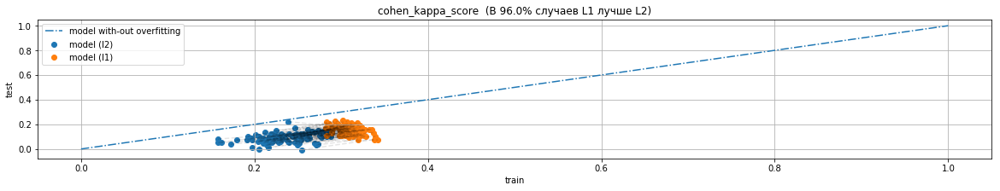

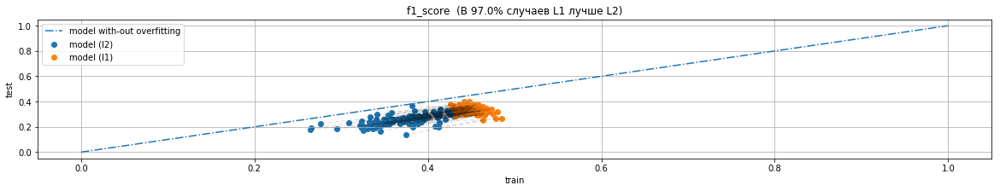

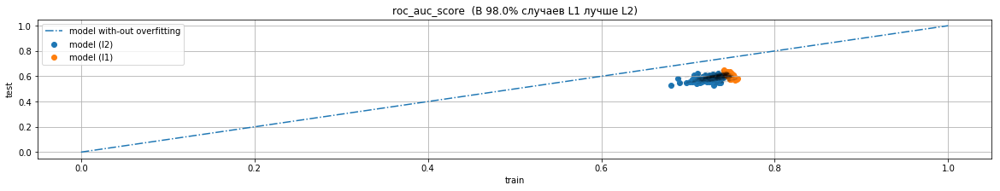

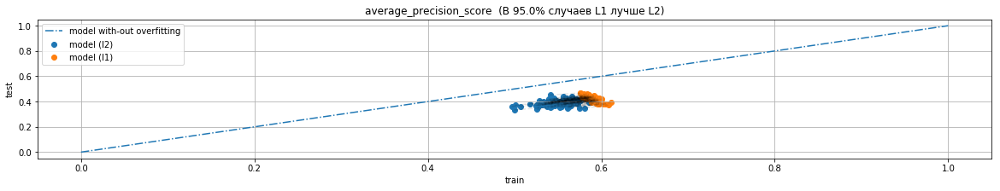

In [0]:
for metric in res_list_l1['train'].keys():
  plt.figure(figsize = (20, 3))
  win_percent = 100*np.mean((np.array(res_list_l1['test'][metric])-np.array(res_list_l2['test'][metric])>0))
  title = "%s  (В %2.1f%% случаев L1 лучше L2)"%(metric, win_percent)
  plt.title(title)
  plt.grid()
  plt.xlabel('train')
  plt.ylabel('test')
  plt.scatter(res_list_l2['train'][metric], res_list_l2['test'][metric], label = 'model (l2)')
  plt.scatter(res_list_l1['train'][metric], res_list_l1['test'][metric], label = 'model (l1)')
  
  # dots-line
  for i in range(num_exp):
    #t =res_list_l2['train'][i]
    plt.plot([res_list_l2['train'][metric][i], res_list_l1['train'][metric][i]],
             [res_list_l2['test'][metric][i], res_list_l1['test'][metric][i]], '--',color = 'black', alpha = 0.1)
  plt.plot([0, 1], [0, 1], '-.', label = 'model with-out overfitting')
  plt.legend()
  plt.show()


#### стало немного лучше

## Feature selection and tuning
#### Возьмем 15 лучших переменных из LR(L1) и 15 лучших с последней модели
#### Обучим на этом бустинг и подберем GridSearch
(он написан руками, времени мало, так быстрее в sklearn нужно думать как сохранять сразу несколько метрик)


##### Затюним бустинг руками

In [0]:
n_L1 = 15
n_DT = 15

feats1 = [i[0] for i in sorted(feat_dct.items(), key = lambda x:-abs(x[1]))][:n_L1]
feats2 = [i[0] for i in sorted({k:v['test']['cohen_kappa_score'] for k, v in feature_importance.items()}.items(), 
                               key = lambda x:-x[1])][:n_DT]

feats = list(set(feats1) | set(feats2))
# feats2
print('Number_of features %d'%len(feats))
model = CatBoostClassifier(n_estimators=50, verbose=False,
                           learning_rate = 0.3,depth = 1,
                           l2_leaf_reg=None)
# model.fit()
_model_args = {'cat_features':['pos_id']}
_ = calculate_metrics(model, 
                      df[feats], 
                      df['Target_c'], 
                      model_name = 'Catboost (tuned by hand)',
                      _model_fit_args = _model_args,
                      _print=True, 
                      _save_res=True)

Number_of features 25
                             test     train
average_precision_score  0.499209  0.733920
cohen_kappa_score        0.246052  0.404188
f1_score                 0.395833  0.518519
roc_auc_score            0.663910  0.840649


##### GridSearch

In [0]:
n_L1 = 15
n_DT = 15

feats1 = [i[0] for i in sorted(feat_dct.items(), key = lambda x:-abs(x[1]))][:n_L1]
feats2 = [i[0] for i in sorted({k:v['test']['cohen_kappa_score'] for k, v in feature_importance.items()}.items(), 
                               key = lambda x:-x[1])][:n_DT]

feats = list(set(feats1) | set(feats2))
# feats2
print('Number_of features %d'%len(feats))
res = {}
counter = 0
for depth in tqdm([1,2,3,4,5]):
  for learning_rate in [0.1, 0.2, 0.3, 0.4, 0.5]:
    for n_estimators in [10, 20, 50, 100]: 
      model = CatBoostClassifier(n_estimators=n_estimators, verbose=False,
                                 learning_rate = learning_rate,depth = depth,
                                 l2_leaf_reg=None)
      
      _model_args = {'cat_features':['pos_id']}
      _ = calculate_metrics(model, 
                            df[feats], 
                            df['Target_c'], 
                            _model_fit_args = _model_args,
                            _print=False, 
                            _save_res=False)
      
      res[(depth, n_estimators, learning_rate)] = (_['test']['cohen_kappa_score'], deepcopy(_))

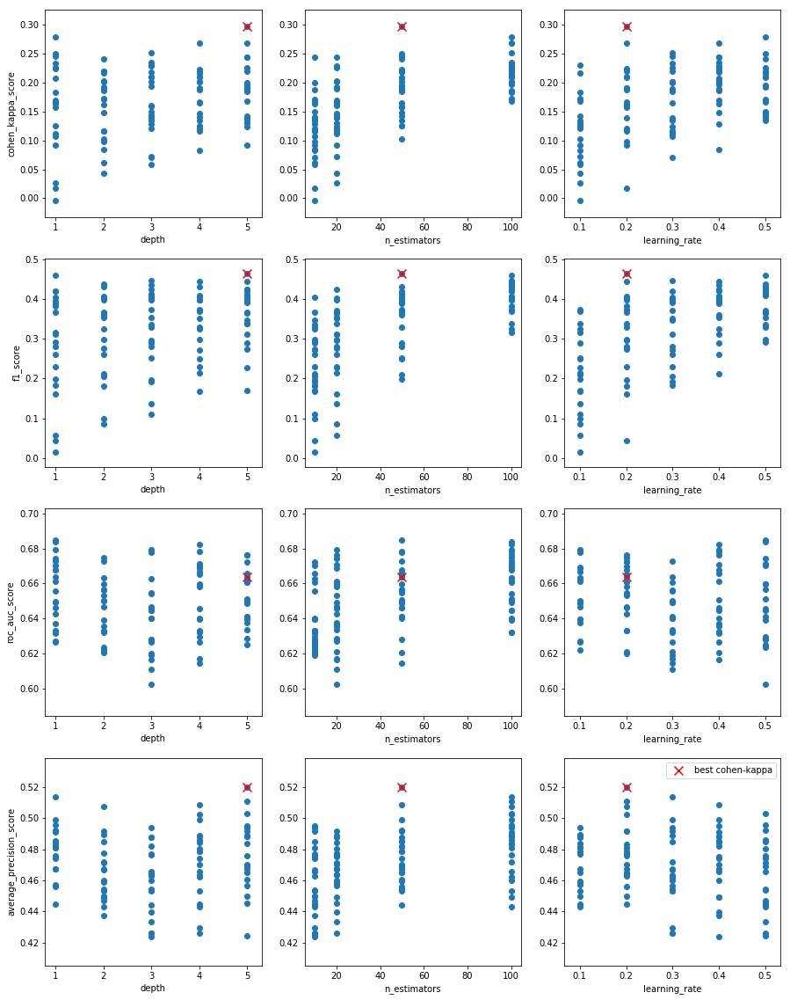

'depth', 'n_estimators', 'learning_rate'
depth  5
learning_rate  0.2
n_estimators  50
(5, 50, 0.2)
                             test     train
average_precision_score  0.520123  1.000000
cohen_kappa_score        0.298033  0.991645
f1_score                 0.464455  0.994242
roc_auc_score            0.663539  1.000000


In [0]:
best_resuls = max(res.items(),key = lambda x:x[1][0])
fig, ax = plt.subplots(4, 3)
fig.set_size_inches(15, 20)


for c, name in enumerate(['depth', 'n_estimators', 'learning_rate']):
  for cy, metric in enumerate(list(res.values())[1][1]['test'].keys()):
    x_list = [i[c]  for i in res.keys()]
    y_list = [i[1]['test'][metric] for i in res.values()]
    ax[cy, c].scatter(x_list, y_list)
    ax[cy, c].scatter([best_resuls[0][c]], [best_resuls[1][1]['test'][metric]], 
                marker = 'x', 
                color = 'red', 
                label = 'best cohen-kappa',
                s=100)
    ax[cy, c].set_xlabel(name)
    if c==0:
      ax[cy, c].set_ylabel(metric)

plt.legend()
plt.show()

print("'depth', 'n_estimators', 'learning_rate'")
depth, n_estimators, learning_rate = best_resuls[0]

print('depth ', depth)
print('learning_rate ', learning_rate)
print('n_estimators ', n_estimators)

print(best_resuls[0])

print(pd.DataFrame(best_resuls[1][1]))

In [0]:
model = CatBoostClassifier(n_estimators=n_estimators, verbose=False,
                           learning_rate = learning_rate,depth = depth,
                           l2_leaf_reg=None)

_model_args = {'cat_features':['pos_id']}

_ = calculate_metrics(model, 
                      df[feats], 
                      df['Target_c'],
                      model_name = 'Catboost (tuned)',
                      _model_fit_args = _model_args,
                      _print=True, 
                      _save_res=True)

                             test     train
average_precision_score  0.520123  1.000000
cohen_kappa_score        0.298033  0.991645
f1_score                 0.464455  0.994242
roc_auc_score            0.663539  1.000000


# Результаты

- Было проведено около 100 экспериментов
- Некоторые простые модели работают хорошо (на 20% лучше примитиверного предсказания по метрики accuracy). Сложные модели не работают, так как переобучаются
- Идеальная простая модель построена не была
- Затюненый бустинг - переобучен, так как скор на train почти единица
- Так и не понятно что это такое Target_c


В данной задаче важно правильно настроить валидацию, так как данных мало и можно очень легко переобучиться. 

Простой зависимоти в данных нет.

In [0]:
# Remove long model_names
# GLOBALMETRICHOLDER = dict(filter(lambda x:len(x[0])<50, GLOBALMETRICHOLDER.items()))

t = {k:{'test_'+k1:v1 for k1, v1 in v['test'].items()} for k,v in GLOBALMETRICHOLDER.items()}
for k,v in GLOBALMETRICHOLDER.items():
  for k1, v1 in v['train'].items():
    t[k]['train_'+k1] = v1
  
pd.DataFrame(t).T.sort_values('test_cohen_kappa_score')[::-1]

,test_average_precision_score,test_cohen_kappa_score,test_f1_score,test_roc_auc_score,train_average_precision_score,train_cohen_kappa_score,train_f1_score,train_roc_auc_score
Catboost (tuned),0.520123,0.298033,0.464455,0.663539,1.000000,0.991645,0.994242,1.000000
Catboost (tuned by hand),0.499209,0.246052,0.395833,0.663910,0.733920,0.404188,0.518519,0.840649
LR(L1)+StdScl,0.449454,0.208058,0.388350,0.653679,0.624043,0.363691,0.507317,0.776645
_2_split_bio_5,0.393938,0.204093,0.311377,0.581876,0.393938,0.204093,0.311377,0.581876
_greedy_2_split_bio_5,0.393938,0.204093,0.311377,0.581876,0.393938,0.204093,0.311377,0.581876
LR(L2)+StdSclr,0.446782,0.187262,0.329670,0.642123,0.575918,0.199252,0.331461,0.741578
"DT(depth = 2, gini)",0.432914,0.186800,0.406926,0.616492,0.534412,0.321301,0.480952,0.697748
LR(L1)+MinMaxSclr,0.439494,0.160993,0.301676,0.634807,0.541618,0.200585,0.340659,0.713144
GB,0.435455,0.151835,0.298343,0.634144,1.000000,0.994436,0.996169,1.000000
_2_split_team_stat_2,0.349871,0.135637,0.362832,0.562739,0.337350,0.097592,0.333333,0.545039


# Задание 2
Очень сложно обучаться на 30 точках, поэтому тут еще больше внимание будет уделяться валидации модели

В этой задаче только 30 наблюдений (комманд)
Это очень мало и не имеет смысла использовать сложные модели.
Будем пробовать только LR, SVM(с различными ядрами), DT

Поскольку таргет это выход в тур, не имеет смысла решать эту задачу как задачу регрессии. Будем решать ее как задачу классификации

#### План:
  - **Feature extraction:** Создадим аггрегаты min, max, med, median, len, std, max-min
  - **Feature selection**  Посмотрим на корреляцию
  -**Experiments** Оставим топ N точек, обучим модель, посмотрим как меняются метрики R2 и cohen-kappa в зависимости от количества регрессоров
  -**Conclusion** Построим график зависимости  добавление признака / метрика cohen-kappa
  
 

### Несколько простых моделей

##### Feature extraction

In [0]:
functions_dict = {'mean':np.mean,
                  'sum':np.sum,
                  'sumabs':lambda x: np.sum(np.abs(x)),
                  'std':np.std,
                  'max':np.max,
                  'min':np.min,
                  'max/min':lambda x:np.max(np.abs(x))/(0.01+np.min(np.abs(x))),
                  'minmax':lambda x:np.max(x)-np.min(x),
                  'median':  np.median,
                  'per90': lambda x:np.quantile(x, 90),
                  'per10': lambda x:np.quantile(x, 10),
                  'len':len}

bigdf = df2.copy()
bigdf.index = bigdf['Team_id']
print('Number of functions: %d'%len(functions_dict))
for funct_name, funct in functions_dict.items():
  print(funct_name)
  t = df.groupby('Team_id').aggregate(funct)
  t = t.rename(columns = {k:funct_name+'_'+k for k in t.keys()})
  bigdf = bigdf.join(t)
  
print('bigdf.shape='+str(bigdf.shape))


Number of functions: 12
mean
sum
sumabs
std
max
min
max/min
minmax
median
per90
per10
len
bigdf.shape=(30, 363)



100%|██████████| 363/363 [00:00<00:00, 1327.93it/s]

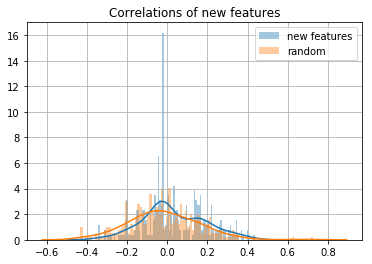

In [0]:
res = {}
random_correlations = {}
for feature in tqdm(bigdf.keys()):
  if feature in ['Target_2', 'Tm']:
    continue

  res[feature] = np.corrcoef(bigdf['Target_2'], bigdf[feature])[0, 1]
  random_correlations[feature] = np.corrcoef(bigdf['Target_2'], bigdf[feature].sample(len(bigdf)))[0, 1]
  
plt.title('Correlations of new features')
plt.grid()
sns.distplot(list(res.values()), bins = 100, label = 'new features')
# random_corr = [np.corrcoef(bigdf['Target_2'], np.random.randn(len(bigdf)))[0,1] for i in range(1000)]
sns.distplot(list(random_correlations.values()), bins = 100, label = 'random')
plt.legend()
plt.show()

Видно, что новые признаки - очень плохие и их корреляция с таргетом не сильно отличается от корреляция случайного признака из того-же распределения с таргетом

*С другой стороны пятно(совместное распределение) немного вытянуто в вверх

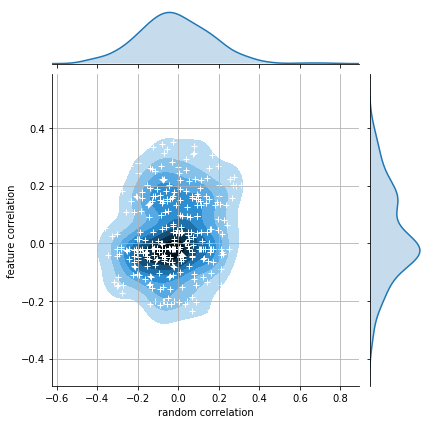

In [0]:
# plt.figure(figsize = (10, 10))
# plt.grid()
# plt.xlabel('random correlation')
# plt.ylabel('feature correlation')
# sns.kdeplot(list(random_correlations.values()), list(res.values()))
# plt.show()
temp = pd.DataFrame({'x':list(random_correlations.values()), 
                    'y':list(res.values())
                   })
# temp = temp.abs()

g = sns.jointplot(x="x", y="y", data=temp, kind="kde")
g.plot_joint(plt.scatter, c="w", s=30, linewidth=1, marker="+")
g.ax_joint.collections[0].set_alpha(0)
g.set_axis_labels("random correlation", "feature correlation")
plt.grid()
plt.show()


На этих признаках будет сложно получить хорошую модель

##### feature importance visualization and simplest model

In [0]:
print('Top 20 features')
features = []
for key, val in sorted(res.items(), key = lambda x:-abs(x[1]))[:20]:
  print(key, (20-len(key))*' ', val)
  features.append(key)

Top 20 features
std_stat_9            0.43517732699316
std_stat_16           0.40373031052967256
std_stat_10           0.39995085282413234
std_stat_3            0.36564641299996115
mean_stat_9           0.3456897920017374
std_stat_7            0.33605220111601014
mean_stat_11          0.3134226101991781
std_stat_12           0.31307419409610404
std_bio_2             -0.3122512650055289
std_stat_15           0.3065240840936842
std_stat_2            0.26736070294055636
std_stat_1            0.2660782982588833
std_bio_4             0.25535991608839576
sumabs_stat_11        0.24531287608238356
sumabs_team_stat_6    -0.202500278372873
std_stat_11           0.19702464998318167
std_stat_6            0.19100197966488425
std_stat_4            0.19084502843996917
sumabs_stat_10        0.1871977136088209
std_Target_r          0.18151121602904335


In [0]:
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score


model = LogisticRegression('l1', C = 1)
X = bigdf[features].reset_index()
lble = LabelEncoder()
y = lble.fit_transform(bigdf['Target_2'])

_functions_dict={'cohen_kappa_score' : lambda x:cohen_kappa_score(x['true'], x['pred']),
                'classification_report' : lambda x:classification_report(x['true'], x['pred']),
                 'r2_score' : lambda x:r2_score(lble.inverse_transform(x['true']), 
                                                lble.inverse_transform(x['pred']))
                }

_ = calculate_metrics(model, X, y, _save_res=False, 
                  _functions_dict=_functions_dict,
                  _task_type=None)

print(_['test']['classification_report'])
print('cohen_kappa_score %2.4f'%_['test']['cohen_kappa_score'])
print('r2 score %2.4f'%_['test']['r2_score'])

              precision    recall  f1-score   support

           0       0.80      0.86      0.83        14
           1       0.60      0.38      0.46         8
           2       0.33      0.25      0.29         4
           3       0.00      0.00      0.00         2
           4       0.00      0.00      0.00         1
           5       0.00      0.00      0.00         1

    accuracy                           0.53        30
   macro avg       0.29      0.25      0.26        30
weighted avg       0.58      0.53      0.55        30

cohen_kappa_score 0.3280
r2 score -0.0127


##### Проверим не случайный ли это результат

In [0]:
res_cks = []
res_r2 = []
model = LogisticRegression('l1', C = 1)
for rs in tqdm(range(100)):
  _ = calculate_metrics(model, X, y, _save_res=False, 
                    _functions_dict=_functions_dict,
                    _rs = rs,
                    _task_type=None)
  res_cks.append(_['test']['cohen_kappa_score'])
  res_r2.append(_['test']['r2_score'])

[]

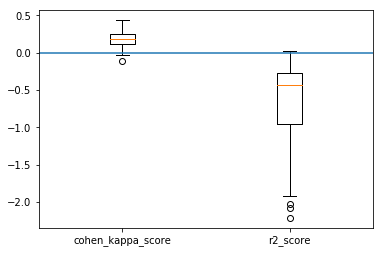

In [0]:
plt.boxplot([res_cks, res_r2])
plt.xticks([1,2],['cohen_kappa_score', 'r2_score'])
plt.plot([-1, 3], [0, 0], label = '--')
plt.plot()

##### SVC



  0%|          | 0/100 [00:00<?, ?it/s]

  5%|▌         | 5/100 [00:00<00:02, 45.78it/s]

 10%|█         | 10/100 [00:00<00:01, 45.57it/s]

 15%|█▌        | 15/100 [00:00<00:01, 45.05it/s]

 20%|██        | 20/100 [00:00<00:01, 45.49it/s]

 25%|██▌       | 25/100 [00:00<00:01, 45.37it/s]

 30%|███       | 30/100 [00:00<00:01, 45.02it/s]

 35%|███▌      | 35/100 [00:00<00:01, 44.58it/s]

 40%|████      | 40/100 [00:00<00:01, 44.77it/s]

 45%|████▌     | 45/100 [00:01<00:01, 44.73it/s]

 50%|█████     | 50/100 [00:01<00:01, 45.24it/s]

 55%|█████▌    | 55/100 [00:01<00:00, 45.48it/s]

 60%|██████    | 60/100 [00:01<00:00, 45.62it/s]

 65%|██████▌   | 65/100 [00:01<00:00, 45.42it/s]

 70%|███████   | 70/100 [00:01<00:00, 45.56it/s]

 75%|███████▌  | 75/100 [00:01<00:00, 45.63it/s]

 80%|████████  | 80/100 [00:01<00:00, 45.80it/s]

 85%|████████▌ | 85/100 [00:01<00:00, 45.40it/s]

 90%|█████████ | 90/100 [00:01<00:00, 45.24it/s]

 95%|█████████▌| 95/100 [00:02<00:00, 45.57it/s]

100%|███

[]

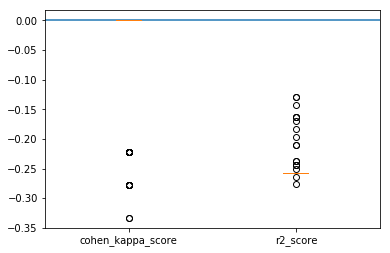

In [0]:
from sklearn.svm import SVC
res_cks = []
res_r2 = []
model = SVC()
for rs in tqdm(range(100)):
  _ = calculate_metrics(model, X, y, _save_res=False, 
                    _functions_dict=_functions_dict,
                    _rs = rs,
                    _task_type=None)
  res_cks.append(_['test']['cohen_kappa_score'])
  res_r2.append(_['test']['r2_score'])

plt.boxplot([res_cks, res_r2])
plt.xticks([1,2],['cohen_kappa_score', 'r2_score'])
plt.plot([-1, 3], [0, 0], label = '--')
plt.plot()

SVC работает хуже LR(L1, entropy), признаков слишком много

##### LR работает не с нулевой точностью
но сравнить две модели сложно - очень большой variance

Если тренировать модель как модель регрессии

##### LR(L1)

In [0]:
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.metrics import r2_score


model = LinearRegression('l1')
X = bigdf[features].reset_index()
y = bigdf['Target_2'].reset_index()['Target_2']

_functions_dict_regr={'r2_score' : lambda x:r2_score(x['true'],x['pred'])
                }

_ = calculate_metrics(model, X, y, _save_res=False, 
                  _functions_dict=_functions_dict_regr,
                  _task_type=None)

print('r2 score %2.4f'%_['test']['r2_score'])

r2 score -25.7356


##### SVR

In [0]:
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.metrics import r2_score


model = SVR()
X = bigdf[features].reset_index()
y = bigdf['Target_2'].reset_index()['Target_2']

_functions_dict_regr={'r2_score' : lambda x:r2_score(x['true'],x['pred'])
                }

_ = calculate_metrics(model, X, y, _save_res=False,
                  _functions_dict=_functions_dict_regr,
                  _task_type=None)

print('r2 score %2.4f'%_['test']['r2_score'])

r2 score -0.1558


### Feature selection

Пройдемся по топ 50 признакам и посмотрим на результат простой модели

In [0]:
#Top 50 признаков
num_exp = 100

model = LogisticRegression('l1', C = 1)
all_features = [i[0] for i in sorted(res.items(), 
                                     key = lambda x:-abs(x[1]))][:50]

X = bigdf[all_features].reset_index()
lble = LabelEncoder()
y = lble.fit_transform(bigdf['Target_2'])

res_list_cks = []
res_list_r2 = []

for i in tqdm(range(1, len(all_features))):
  small_features = all_features[:i]
  res_cks = []
  res_r2 = []
  for rs in range(num_exp):
    _ = calculate_metrics(model, X[small_features], y, 
                          _save_res=False, 
                          _functions_dict=_functions_dict,
                          _rs = rs,
                          _task_type=None)
    res_cks.append(_['test']['cohen_kappa_score'])
    res_r2.append(_['test']['r2_score'])
    
  res_list_cks.append(res_cks)
  res_list_r2.append(res_r2)
  


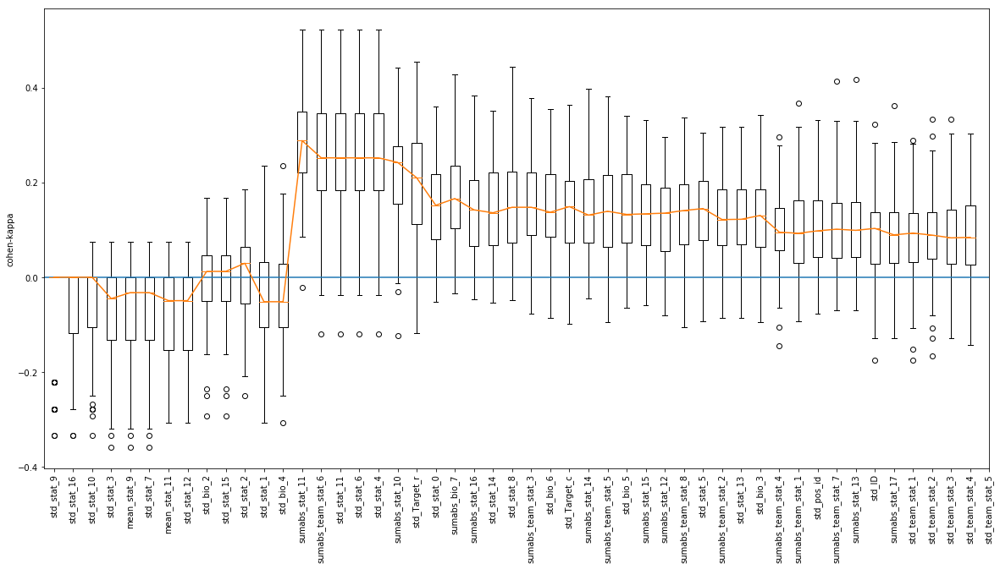

Best number of features 13 is cohen-kappa = 0.1217 (-0.0516, 0.2883)


In [0]:
plt.figure(figsize = (20, 10))
plt.boxplot(res_list_cks)
plt.plot([0, 10+len(all_features)+1], [0, 0])
temp_results = [np.median(i) for i in res_list_cks]
plt.plot(list(range(1, len(all_features))), temp_results)
plt.ylabel('cohen-kappa')
plt.xticks(list(range(1, len(all_features)+1)), all_features, rotation='vertical')
plt.show()

print('Best number of features %d is cohen-kappa = %2.4f (%2.4f, %2.4f)'%(
    np.argmax(temp_results), 
    np.median(temp_results),
    np.min(temp_results),np.max(temp_results)
    ))

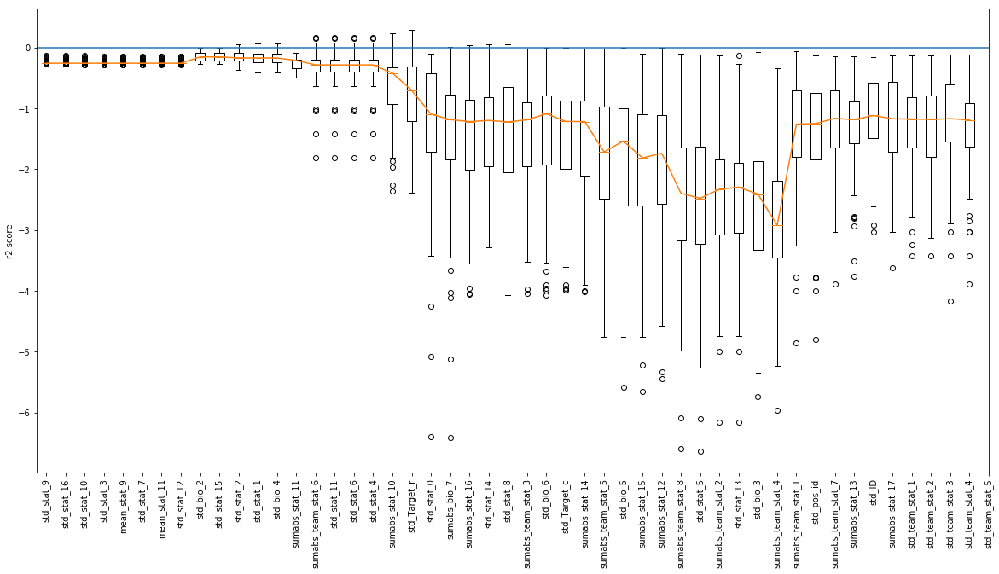

Best number of features 8 is r2 = -1.1691 (-2.9238, -0.1531)


In [0]:
plt.figure(figsize = (20, 10))
plt.boxplot(res_list_r2)
plt.plot([0, 10+len(all_features)+1], [0, 0])
temp_results = [np.median(i) for i in res_list_r2]
plt.plot(list(range(1, len(all_features))), temp_results)
plt.ylabel('r2 score')
plt.xticks(list(range(1, len(all_features)+1)), all_features, rotation='vertical')
plt.show()

print('Best number of features %d is r2 = %2.4f (%2.4f, %2.4f)'%(
    np.argmax(temp_results), 
    np.median(temp_results),
    np.min(temp_results),np.max(temp_results)
    ))

### Tuning best model (hyper opt)

In [0]:
!pip install hyperopt

In [0]:
#https://towardsdatascience.com/an-introductory-example-of-bayesian-optimization-in-python-with-hyperopt-aae40fff4ff0
X = bigdf[best_features].reset_index()[best_features]
lble = LabelEncoder()
y = lble.fit_transform(bigdf['Target_2'])

def objective(kwargs):
    """Objective function to minimize"""
    model = LogisticRegression(**kwargs)
    # Create the polynomial object
    
    res = calculate_metrics(model, X, y, _save_res=False, 
                            _functions_dict=_functions_dict,
                            _task_type = 'regr' 
                           )

    # Return the value of the polynomial
    return {'loss': -res['test']['cohen_kappa_score'], 
            'status': STATUS_OK ,
            'all':deepcopy(res)
           }

from hyperopt import fmin, STATUS_OK
from hyperopt import Trials
# Create a trials object
tpe_trials = Trials()
from hyperopt import hp
# Create the domain space
l1_ratio = hp.uniform('l1_ratio', 0, 1)
C = hp.loguniform('C', -2, 3)

space = {'l1_ratio':l1_ratio,
         'C':C,
         'tol':1e-12,
         'penalty':'elasticnet',
         'solver':'saga'}


from hyperopt import tpe
# Create the algorithm
tpe_algo = tpe.suggest

# Run 2000 evals with the tpe algorithm
tpe_best = fmin(fn=objective, space=space,
                algo=tpe_algo, trials=tpe_trials, verbose = 0,
                max_evals=1000)

print(tpe_best)




 77%|███████▋  | 773/1000 [00:34<00:10, 20.84it/s, best loss: -0.012345679012345623]


 78%|███████▊  | 776/1000 [00:34<00:10, 20.98it/s, best loss: -0.012345679012345623]


 78%|███████▊  | 779/1000 [00:34<00:10, 20.82it/s, best loss: -0.012345679012345623]


 78%|███████▊  | 782/1000 [00:35<00:10, 20.85it/s, best loss: -0.012345679012345623]


 78%|███████▊  | 785/1000 [00:35<00:10, 20.88it/s, best loss: -0.012345679012345623]


 79%|███████▉  | 788/1000 [00:35<00:10, 20.91it/s, best loss: -0.012345679012345623]


 79%|███████▉  | 791/1000 [00:35<00:10, 20.66it/s, best loss: -0.012345679012345623]


 79%|███████▉  | 794/1000 [00:35<00:09, 20.62it/s, best loss: -0.012345679012345623]


 80%|███████▉  | 797/1000 [00:35<00:09, 20.63it/s, best loss: -0.012345679012345623]


 80%|████████  | 800/1000 [00:35<00:09, 20.53it/s, best loss: -0.012345679012345623]


 80%|████████  | 803/1000 [00:36<00:09, 20.34it/s, best loss: -0.012345679012345623]


 81%|████████  | 806/1000 [00:36<00:09, 

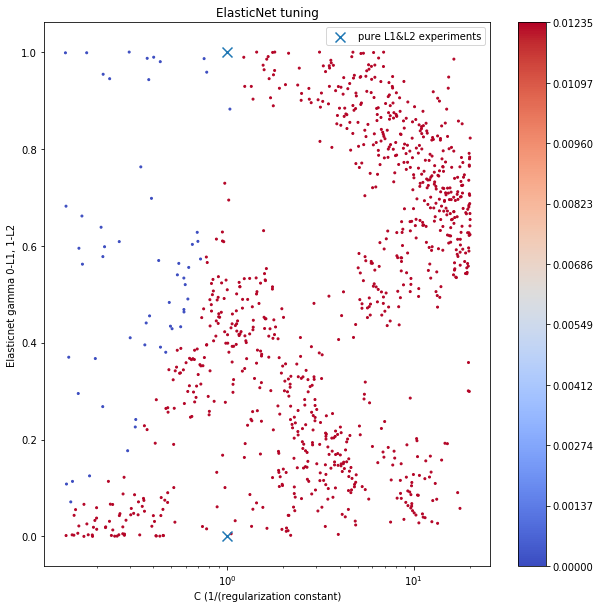

In [0]:
cks_list = [-i['result']['loss'] for i in tpe_trials.trials[:-1]]
c_list = [i['misc']['vals']['C'][0] for i in tpe_trials.trials[:-1]]
gamma_list = [i['misc']['vals']['l1_ratio'][0] for i in tpe_trials.trials[:-1]]

cmap=plt.cm.coolwarm
plt.figure(figsize = (10, 10))
plt.scatter(x=c_list, y=gamma_list, 
            c=cks_list, 
            cmap=cmap, s = 4, alpha = 1)
plt.xscale('log')
plt.colorbar(ticks = np.linspace(min(cks_list), max(cks_list), 10))
plt.scatter([1, 1], [0, 1], marker = 'x', s = 100, label = 'pure L1&L2 experiments')

plt.title('ElasticNet tuning')
plt.xlabel('C (1/(regularization constant)')
plt.ylabel("Elasticnet gamma 0-L1, 1-L2")
plt.legend()
plt.show()


##### Результаты тюнинга ElasticNet

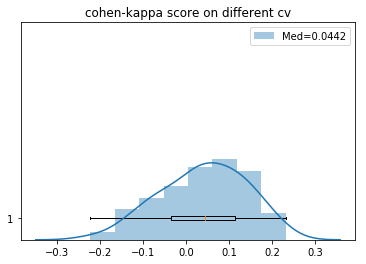

In [0]:
C = tpe_trials.best_trial['misc']['vals']['C'][0]
l1_ratio = tpe_trials.best_trial['misc']['vals']['l1_ratio'][0]

model = LogisticRegression(C = C, l1_ratio=l1_ratio)
temp = []
for rs in range(100):
    _ = calculate_metrics(model, X[best_features], y, _save_res=False, 
                      _functions_dict=_functions_dict,
                      _rs = rs,
                      _task_type='class')
    temp.append(_['test']['cohen_kappa_score'])

plt.title('cohen-kappa score on different cv')
plt.boxplot(temp, vert = False)
sns.distplot(temp, label = "Med=%2.4f"%np.median(temp))
plt.ylim(0, 10)
# plt.boxplot(temp, vert = False)
plt.legend()
plt.show()

##### Результаты тюнинга LogisticRegression(L1)

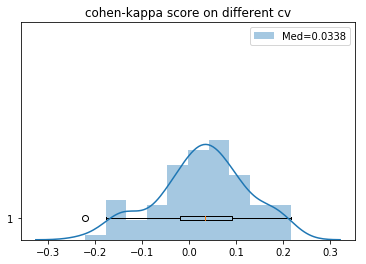

In [0]:
C = tpe_trials.best_trial['misc']['vals']['C'][0]
l1_ratio = tpe_trials.best_trial['misc']['vals']['l1_ratio'][0]

model = LogisticRegression(C = C, l1_ratio=l1_ratio)
temp = []
for rs in range(100):
    _ = calculate_metrics(model, X[best_features], y, _save_res=False, 
                      _functions_dict=_functions_dict,
                      _rs = rs,
                      _task_type='class')
    temp.append(_['test']['cohen_kappa_score'])

plt.title('cohen-kappa score on different cv')
plt.boxplot(temp, vert = False)
sns.distplot(temp, label = "Med=%2.4f"%np.median(temp))
plt.ylim(0, 10)
# plt.boxplot(temp, vert = False)
plt.legend()
plt.show()

Переобучились и получили модель хуже

Примерно то-же семое будет, если пробовать использовать сложные модели и тюнить параметры на 15-ти точках

# Результаты:
Лучшая модель тут показывала результат 0.12+-0.1 cohen-kappa (это больше нуля, но все равно очень мало)

# Задание 3

Team_id совпадает с алфавитным порядком комманд

Основная таблица со статистикой
https://www.basketball-reference.com/leagues/NBA_2014.html

Она скопирована и загружена в basketball_refference_main_table.csv

## Загрузим данные из интернета
(сильно быстрее сделать это руками, чем парсить таблицу html)

## Таблица Team Per Game Stats

In [0]:
!ls drive/My\ Drive/sber_tz

basketball_refference_main_table.csv  problem_data.csv	Задача.docx
problem_data2.csv		      Problem.ipynb


In [0]:
fn= 'drive/My Drive/sber_tz/basketball_refference_main_table.csv'
com_stats = pd.read_csv(fn, sep = ',')
data = pd.concat([df2, com_stats], axis = 1)
data

,Tm,Team_id,Target_2,Rk,Team▲,G,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
0,ATL,1,0.2500,1,Atlanta Hawks*,82,241.8,37.3,81.6,0.458,9.4,25.8,0.363,28.0,55.8,0.502,17.0,21.7,0.781,8.7,31.3,40.0,24.9,8.3,4.0,15.3,19.2,101.0
1,BOS,2,0.0625,2,Boston Celtics,82,240.6,36.5,83.9,0.435,7.0,21.1,0.333,29.5,62.9,0.470,16.2,20.8,0.777,12.0,30.5,42.5,21.0,7.1,4.2,15.4,21.3,96.2
2,BRK,3,0.0625,3,Brooklyn Nets*,82,242.4,35.7,77.9,0.459,8.6,23.4,0.369,27.1,54.5,0.497,18.4,24.4,0.753,8.8,29.4,38.1,20.9,8.6,3.8,14.5,21.7,98.5
3,CHI,4,0.1250,4,Charlotte Bobcats*,82,242.7,36.3,82.1,0.442,6.3,17.9,0.351,30.0,64.1,0.468,18.0,24.4,0.737,9.5,33.2,42.7,21.7,6.1,5.1,12.3,18.2,96.9
4,CHO,5,0.0000,5,Chicago Bulls*,82,243.0,34.7,80.2,0.432,6.2,17.8,0.348,28.5,62.4,0.456,18.1,23.3,0.779,11.4,32.7,44.1,22.7,7.2,5.2,14.9,19.1,93.7
5,CLE,6,0.5000,6,Cleveland Cavaliers,82,243.0,37.0,84.8,0.437,7.1,20.0,0.356,29.9,64.8,0.461,17.0,22.7,0.751,12.1,32.1,44.1,21.2,7.1,3.7,14.2,20.0,98.2
6,DAL,7,0.0625,7,Dallas Mavericks*,82,241.8,39.6,83.6,0.474,8.8,22.9,0.384,30.8,60.7,0.508,16.8,21.1,0.795,10.2,30.7,40.9,23.6,8.6,4.3,13.5,20.0,104.8
7,DEN,8,0.0000,8,Denver Nuggets,82,240.9,38.4,85.9,0.447,8.6,23.9,0.358,29.8,62.0,0.481,19.1,26.3,0.726,12.3,33.1,45.4,22.4,7.5,5.6,15.9,23.0,104.4
8,DET,9,0.0000,9,Detroit Pistons,82,241.2,38.8,86.9,0.447,6.2,19.3,0.321,32.6,67.6,0.483,17.3,25.7,0.670,14.6,30.8,45.4,20.9,8.4,4.8,14.5,20.3,101.0
9,GSW,10,1.0000,10,Golden State Warriors*,82,241.8,39.5,85.4,0.462,9.4,24.8,0.380,30.0,60.6,0.496,15.9,21.1,0.753,10.9,34.4,45.3,23.3,7.8,5.0,15.2,21.8,104.3


In [0]:
data.keys()

Index(['Tm', 'Team_id', 'Target_2', 'Rk', 'Team▲', 'G', 'MP', 'FG', 'FGA',
       'FG%', '3P', '3PA', '3P%', '2P', '2PA', '2P%', 'FT', 'FTA', 'FT%',
       'ORB', 'DRB', 'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS'],
      dtype='object')

In [0]:
data.keys()
features = list(data.keys())
for feat in ['Tm', 'Team▲', 'Target_2']:
  features.remove(feat)
# features.remove('Tm')
# features.remove('Team▲')

#### Задача регрессии

In [0]:
features = list(data.keys())

for key in ['Tm', 'Target_2','Team▲']:
  features.remove(key)

In [0]:
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.metrics import r2_score


model = LinearRegression('l1')
X = data[features].reset_index()
y = data['Target_2'].reset_index()['Target_2']

_functions_dict_regr={'r2_score' : lambda x:r2_score(x['true'],x['pred'])
                }

_ = calculate_metrics(model, X, y, _save_res=False, 
                  _functions_dict=_functions_dict_regr,
                  _task_type=None)

print('r2 score %2.4f'%_['test']['r2_score'])

r2 score -21.9014


#### Задача классификации

In [0]:
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score


model = LogisticRegression('l1', C = 0.5)
X = data[features].reset_index()
lble = LabelEncoder()
y = lble.fit_transform(data['Target_2'])

_functions_dict={'cohen_kappa_score' : lambda x:cohen_kappa_score(x['true'], x['pred']),
                'classification_report' : lambda x:classification_report(x['true'], x['pred']),
                 'r2_score' : lambda x:r2_score(lble.inverse_transform(x['true']), 
                                                lble.inverse_transform(x['pred']))
                }

_ = calculate_metrics(model, X, y, _save_res=False, 
                  _functions_dict=_functions_dict,
                  _task_type=None)

print(_['test']['classification_report'])
print('cohen_kappa_score %2.4f'%_['test']['cohen_kappa_score'])
print('r2 score %2.4f'%_['test']['r2_score'])

              precision    recall  f1-score   support

           0       0.43      0.64      0.51        14
           1       0.00      0.00      0.00         8
           2       0.00      0.00      0.00         4
           3       0.00      0.00      0.00         2
           4       0.00      0.00      0.00         1
           5       0.00      0.00      0.00         1

    accuracy                           0.30        30
   macro avg       0.07      0.11      0.09        30
weighted avg       0.20      0.30      0.24        30

cohen_kappa_score -0.1496
r2 score -0.2366


In [0]:
res = {}
random_correlations = {}

for feature in features:
  res[feature] = np.corrcoef(data['Target_2'], data[feature])[0, 1]
  random_correlations[feature] = np.corrcoef(data2['Target_2'], data2[feature].sample(len(data2)))[0, 1]

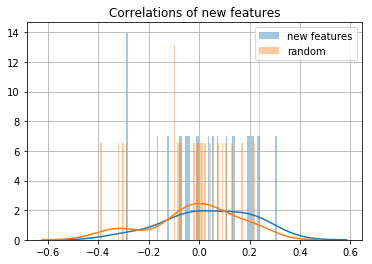

In [0]:
plt.title('Correlations of new features')
plt.grid()
sns.distplot(list(res.values()), bins = 100, label = 'new features')
# random_corr = [np.corrcoef(bigdf['Target_2'], np.random.randn(len(bigdf)))[0,1] for i in range(1000)]
sns.distplot(list(random_correlations.values()), bins = 100, label = 'random')
plt.legend()
plt.show()

In [0]:
features_add = []
for key, val in sorted(res.items(), key = lambda x:-abs(x[1])):
  print(key, (20-len(key))*' ', val)
  features_add.append(key)

Team_id               -0.28779375001065044
Rk                    -0.28779375001065044
G                     nan
DRB                   0.3084204304542195
3P                    0.24194256265610095
3P%                   0.2363811057728385
TRB                   0.21597152519311477
AST                   0.20928610551696936
3PA                   0.1992789698896238
FG                    0.1929617958467599
FT                    -0.1627950421863043
FGA                   0.13932572153761116
PTS                   0.1328407071315307
FTA                   -0.12418698368474772
MP                    0.10981379033313456
FT%                   -0.07492480301795698
FG%                   0.07444509649792692
2PA                   -0.06938229473931488
2P%                   0.05691091211838703
STL                   -0.050579689867137734
2P                    -0.04437954513253591
BLK                   -0.0380074281052592
TOV                   0.03668221415242137
ORB                   -0.007575343111252098
PF 

In [0]:
#Top 50 признаков
num_exp = 100

model = LogisticRegression('l1', C = 1)
all_features = [i[0] for i in sorted(res.items(), 
                                     key = lambda x:-abs(x[1]))][:50]

X = data[all_features].reset_index()
lble = LabelEncoder()
y = lble.fit_transform(data['Target_2'])

res_list_cks = []
res_list_r2 = []

for i in tqdm(range(1, len(all_features))):
  small_features = all_features[:i]
  res_cks = []
  res_r2 = []
  for rs in range(num_exp):
    _ = calculate_metrics(model, X[small_features], y, 
                          _save_res=False, 
                          _functions_dict=_functions_dict,
                          _rs = rs,
                          _task_type=None)
    res_cks.append(_['test']['cohen_kappa_score'])
    res_r2.append(_['test']['r2_score'])
    
  res_list_cks.append(res_cks)
  res_list_r2.append(res_r2)
  









  0%|          | 0/24 [00:00<?, ?it/s]






  4%|▍         | 1/24 [00:01<00:45,  1.97s/it]






  8%|▊         | 2/24 [00:03<00:43,  1.97s/it]






 12%|█▎        | 3/24 [00:05<00:41,  1.98s/it]






 17%|█▋        | 4/24 [00:09<00:49,  2.50s/it]






 21%|██        | 5/24 [00:14<00:58,  3.08s/it]






 25%|██▌       | 6/24 [00:18<01:02,  3.47s/it]






 29%|██▉       | 7/24 [00:24<01:13,  4.35s/it]






 33%|███▎      | 8/24 [00:32<01:24,  5.28s/it]






 38%|███▊      | 9/24 [00:39<01:29,  5.97s/it]






 42%|████▏     | 10/24 [00:49<01:36,  6.91s/it]






 46%|████▌     | 11/24 [00:59<01:42,  7.88s/it]






 50%|█████     | 12/24 [01:12<01:54,  9.57s/it]






 54%|█████▍    | 13/24 [01:29<02:08, 11.65s/it]






 58%|█████▊    | 14/24 [01:46<02:14, 13.44s/it]






 62%|██████▎   | 15/24 [02:08<02:22, 15.80s/it]






 67%|██████▋   | 16/24 [02:29<02:19, 17.42s/it]






 71%|███████   | 17/24 [02:49<02:08, 18.40s/it]






 75%|███████▌  | 18/24 [03:11<01:55, 19

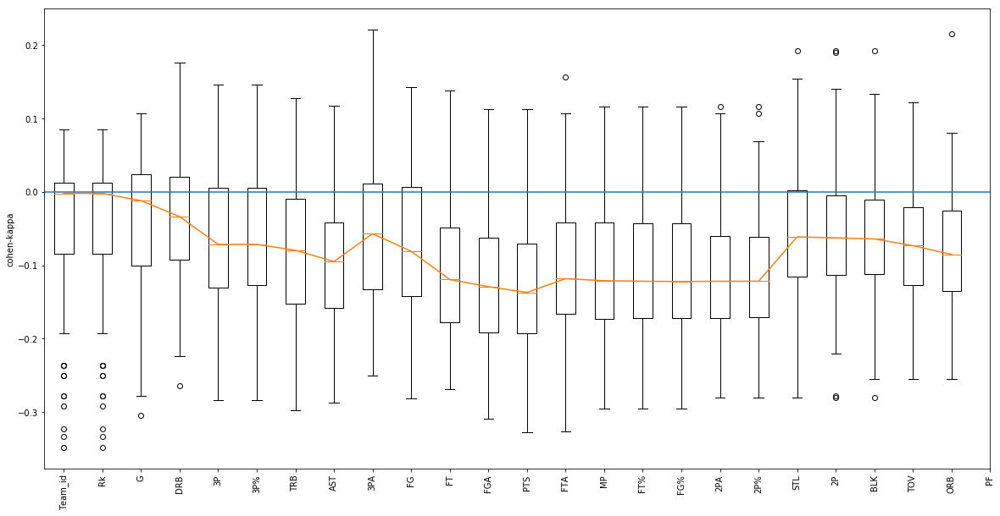

Best number of features 0 is cohen-kappa = -0.0802 (-0.1370, -0.0020)


In [0]:
plt.figure(figsize = (20, 10))
plt.boxplot(res_list_cks)
plt.plot([0, 10+len(all_features)+1], [0, 0])
temp_results = [np.median(i) for i in res_list_cks]
plt.plot(list(range(1, len(all_features))), temp_results)
plt.ylabel('cohen-kappa')
plt.xticks(list(range(1, len(all_features)+1)), all_features, rotation='vertical')
plt.show()

print('Best number of features %d is cohen-kappa = %2.4f (%2.4f, %2.4f)'%(
    np.argmax(temp_results), 
    np.median(temp_results),
    np.min(temp_results),np.max(temp_results)
    ))

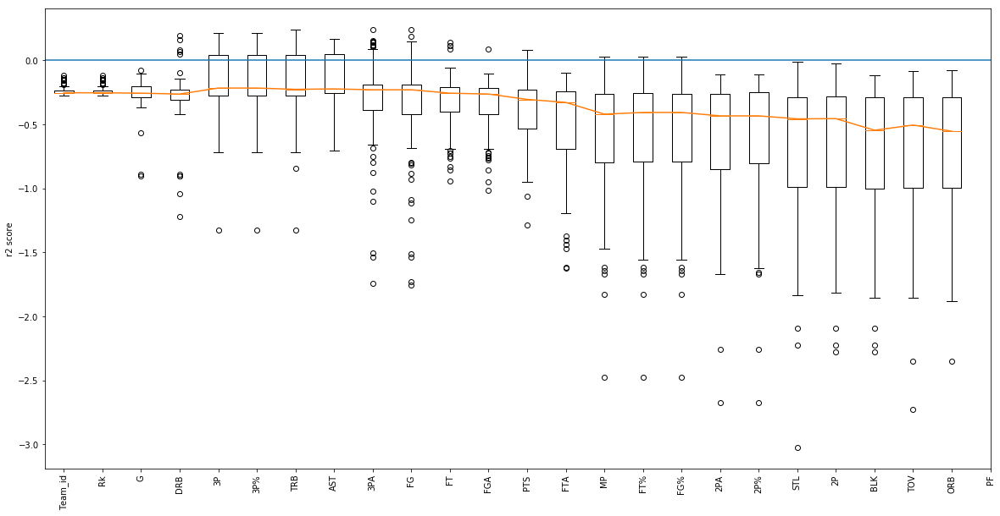

Best number of features 4 is r2 = -0.2843 (-0.5541, -0.2166)


In [0]:
plt.figure(figsize = (20, 10))
plt.boxplot(res_list_r2)
plt.plot([0, 10+len(all_features)+1], [0, 0])
temp_results = [np.median(i) for i in res_list_r2]
plt.plot(list(range(1, len(all_features))), temp_results)
plt.ylabel('r2 score')
plt.xticks(list(range(1, len(all_features)+1)), all_features, rotation='vertical')
plt.show()

print('Best number of features %d is r2 = %2.4f (%2.4f, %2.4f)'%(
    np.argmax(temp_results), 
    np.median(temp_results),
    np.min(temp_results),np.max(temp_results)
    ))

## Эта таблица не должна дать никакого прироста
Попробуем другие

In [0]:
bigdf[best_features].head().reset_index()

,Team_id,std_stat_9,std_stat_16,std_stat_10,std_stat_3,mean_stat_9,std_stat_7,mean_stat_11,std_stat_12
0,1,1.713671,5.501212,2.257423,9.778889,2.775000,0.228462,1.987500,0.502618
1,2,1.451657,5.397664,2.052337,10.077306,2.850000,0.225858,2.021429,0.409033
2,3,1.577373,8.752506,1.969983,9.563231,2.558333,0.108139,2.283333,0.394181
3,4,2.387594,5.279714,3.315802,10.417857,3.133333,0.114608,2.416667,0.483046
4,5,2.127386,5.647623,2.662537,8.882206,3.292308,0.139693,2.030769,0.295696


In [0]:
# data2 = data2.drop('Team_id', axis = 1)
# data2 = data2.drop('index', axis = 1)
data2['Team_id'] = data2['Rk']

In [0]:
del _functions_dict['cohen_kappa_score']

In [0]:
from catboost import CatBoostRegressor
# data2 = pd.concat([data, 
#                    bigdf[best_features].reset_index()], axis = 1)
# del data2['index']

# del data2['level_0']
# del data2['index']
# data2 = data2.reset_index()
_functions_dict={'r2_score' : lambda x:r2_score(x['true'], x['pred'])}
  
model = CatBoostRegressor(n_estimators=1000)
_ = calculate_metrics(model, 
                      X = data2[features], 
                      y = data2['Target_2'], 
                      _functions_dict=_functions_dict,
                     _rs = rs, 
                     _save_res = False,
                     _print = True,
                     _task_type=None)

# Вывод
Я потратил на это задание сутки  (чтобы все было честно)

Пункт 3  не взлетел, я выбрал не правильную таблицу. (На сайте их 5)

Парсить по игракам тоже можно, но эти признаки по смыслу есть в задании 1


## Что можно еще сделать
 - Загрузить другие данные для пункта 3
   - Парсинг таблиц автоматически -  это хорошо, но по трудозатратам это дольше ручного copy browser - paste excel

 - Попробовать делать с помощью модели ставки 
   (ставить в первом туре если у кого-нибудь из двух комманд больше вероятность выйти из play-off)
  - Так можно примерно сравнить качество модели с букмекерскими
  - 14-15 сезон NBA очень отличается от 13-14 (сильнее чем сезоны после),
    если аккуратно построить график, можно это показать
   - Не понятно какие метрики для пункта 2 и 3 лучше использовать, это бы позволило дать объективную оценку модели, этот подход дал бы понятную величину
  
  

**Как сделать симуляцию букмекерских ставок:**


Загрузим базу ставок отсюда https://www.kaggle.com/ehallmar/nba-historical-stats-and-betting-data

Достанем оттуда коэффициенты

Будем ставить на ту комманду для которой r больше (в случае классификации r это $\sum_{i=1}^{i=5}{p_i/*2^{-i}}$  , $p_i$ - вероятность класса  $n_i$ индекс класса по убыванию)